<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Base/HW1_Regression_with_inference_base_pt1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import pickle
import os

from ydata_profiling import ProfileReport

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

random.seed(42)
np.random.seed(42)

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Your answer here`
Сиды нужны для большего контроля кода. Мы фиксируем константу, и она избавляет от неопределенности в испытаниях модели (начиная с упрощения дебага упавшего кода, заканчивая просто анализом испытаний). Можно работать в рамках одной модели, а можно разным поставить одно и то же значение сида, и это увеличит ясность в интерпретации нескольких моделей.

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [2]:
import pandas as pd

In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

In [4]:
print('30 случайных строк тренировочного')
df_train.sample(30)

30 случайных строк тренировочного


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [5]:
print('Первые 5 строк тестового')
df_test.head()

Первые 5 строк тестового


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [6]:
print('Последние 5 строк тестового')
df_test.tail()

Последние 5 строк тестового


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [7]:
print('Пропуски в train:\n')
missing_train = df_train.isna().sum()
for name, count in missing_train.items():
  if count > 0:
    print(f"{name}: {count}")

print('\n\nПропуски в test:\n')
missing_test = df_test.isna().sum()
for name, count in missing_test.items():
  if count > 0:
    print(f"{name}: {count}")

Пропуски в train:

mileage: 202
engine: 202
max_power: 196
torque: 203
seats: 202


Пропуски в test:

mileage: 19
engine: 19
max_power: 19
torque: 19
seats: 19


In [8]:
print('Явные дубликаты в train:\n', df_train.duplicated().sum(), '\n\nЯвные дубликаты в test:\n', df_test.duplicated().sum())


Явные дубликаты в train:
 985 

Явные дубликаты в test:
 62


In [9]:
print('Сколько пропусков в столбцах трейн:\n', df_train.isna().sum())

print('\n\nСколько пропусков в столбцах тест:\n', df_test.isna().sum())

Сколько пропусков в столбцах трейн:
 name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64


Сколько пропусков в столбцах тест:
 name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64


___Решение задания 1, пункт 2___

__Что видно по случайным/первым 5/последним 5 строкам:__

В датасете из 13 колонок наблюдаем __7 категориальных__ признаков (year, seats (порядковые категориальные), name, fuel, seller_type, transmission, owner), __2 числовых__ (selling_price, km_driven) и __4 текстовых__, которые нужно преобразовать в числовые (mileage, engine, max_power, torque).

Из текстовых признаков 3 мы можем преобразовать легко (просто убрать текстовые приписки для признаков mileage, engine, max_power), но torque имеет более слжную форму записи, хотя все равно остается преобразуемым.

В столбцах mileage, engine, max_power, torque, seats присутствуют пропуски в объеме около 3% от общего объема каждого датасета. Такой объем не должен повлиять на обучение, поэтому можно их удалить.

Также отметим значительное число полных дубликатов, которые также придется удалить из датасета.




__Достаточно ли метода duplicated для анализа дубликатов:__

Метода duplicated в действительности может быть недостаточно для более глубокого анализа данных. Он помогает выявить полные дубли (полностью совпадающие строки), однако этого может быть мало для более детального анализа датасета.

Поскольку в реальности могут быть случаи, где в дубле строки есть пропуски (остальные параметры при этом совпадают), либо дубль, где один из параметров записан в другом формате/с опечаткой. Такие дубли не будет идентифицированы.

Тем не менее, стоит оставить duplicated для первичного анализа, чтобы избавиться от точно ненужных данных, а для дальнейшего анализа уже использовать какие-то более тонкие методы, чтобы ловить менее очевидные дубли.

___Решение задания 1, пункт 3___

In [10]:
profile_train = ProfileReport(df_train,title="Дашборд для df_train")

profile_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████| 13/13 [00:00<00:00, 332475.32it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
profile_test = ProfileReport(df_test,title="Дашборд для df_test")

profile_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████| 13/13 [00:00<00:00, 318865.22it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0
6996,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


Мы обнаружили пропуски. Давайте избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [13]:
#Для трейна:
#с регулярками как-то очень соображала долго, в итоге сгенерила их в чате, НО разобралась как они работают

#сделаем признаки числовыми. то, что хотим сделать флоатом:
for i in ['mileage', 'engine', 'max_power']:
    df_train[i] = pd.to_numeric(df_train[i].str.extract('(\d+\.?\d*)')[0], downcast='float', errors='coerce')

#параметр torque, сложнее, разделим его на два параметра: на крутящий момент (?) и на число оборотов двигателя:  
df_train[['torque_moment', 'torque_value']] = df_train['torque'].str.extract('(\d+\.?\d*)\s*(?:Nm|kgm).*?@\s*(\d+)')

df_train['torque_moment'] = pd.to_numeric(df_train['torque_moment'], errors='coerce')
df_train['torque_value'] = pd.to_numeric(df_train['torque_value'], errors='coerce')

df_train = df_train.drop('torque', axis=1)

#теперь можно заполнять медианами
parameters_train = ['mileage', 'engine', 'max_power', 'torque_moment', 'torque_value', 'seats']
for i in parameters_train:
    median = df_train[i].median()
    df_train[i].fillna(median, inplace=True)

 

#Для теста:
#сначала обработаем данные параметров как для тренировочного сета: 
for i in ['mileage', 'engine', 'max_power']:
    df_test[i] = pd.to_numeric(df_test[i].str.extract('(\d+\.?\d*)')[0], downcast='float', errors='coerce')
df_test[['torque_moment', 'torque_value']] = df_test['torque'].str.extract('(\d+\.?\d*)\s*(?:Nm|kgm).*?@\s*(\d+)')
df_test['torque_moment'] = pd.to_numeric(df_test['torque_moment'], errors='coerce')
df_test['torque_value'] = pd.to_numeric(df_test['torque_value'], errors='coerce')
df_test = df_test.drop('torque', axis=1)

#поскольку берем медианы, посчитанные для тренировочного сета: 
parameters_test = ['mileage', 'engine', 'max_power', 'torque_moment', 'torque_value', 'seats']
for i in parameters_test:
    median_train=df_train[i].median()
    df_test[i].fillna(median_train, inplace=True)

In [14]:
#проверим, что теперь пропусков не осталось
print('Сколько пропусков в столбцах трейн:\n', df_train.isna().sum())

print('\n\nСколько пропусков в столбцах тест:\n', df_test.isna().sum())

Сколько пропусков в столбцах трейн:
 name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
seats            0
torque_moment    0
torque_value     0
dtype: int64


Сколько пропусков в столбцах тест:
 name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
seats            0
torque_moment    0
torque_value     0
dtype: int64


### **Задание 2 (0.5 балла)**

На прошлом шаге вы убедились, что явных дубликатов в таблице нет. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


**Комментарий:** По моим данным, полные дубликаты в датасетах ЕСТЬ. Просто учтем это.

In [15]:
#смотрим дубли по всем столбцам кроме selling_price: 
result = df_train.duplicated(subset=['name', 'year', 'km_driven', 'fuel', 'seller_type', 'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque_moment', 'torque_value', 'seats']).sum()
print('Количество дублей для тренировочного датасета без учета таргета:')
print(result)

Количество дублей для тренировочного датасета без учета таргета:
1159


In [16]:
#покажем эти строки
duplicates_train = df_train[df_train.duplicated(subset=['name', 'year', 'km_driven', 'fuel', 'seller_type', 'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque_moment', 'torque_value', 'seats'])]
print(duplicates_train)

                                          name  year  selling_price  \
254                   Hyundai Grand i10 Sportz  2017         450000   
258                           Maruti Swift VXI  2012         330000   
268                     Maruti Swift Dzire VXI  2014         400000   
324   Jaguar XE 2016-2019 2.0L Diesel Prestige  2017        2625000   
325                              Lexus ES 300h  2019        5150000   
...                                        ...   ...            ...   
6947                    Chevrolet Spark 1.0 LS  2010         140000   
6984  Ford Freestyle Titanium Plus Diesel BSIV  2018         746000   
6989                    Maruti Swift Dzire VDI  2015         625000   
6997                           Tata Indigo CR4  2013         290000   
6998                           Tata Indigo CR4  2013         290000   

      km_driven    fuel seller_type transmission         owner    mileage  \
254       35000  Petrol  Individual       Manual   First Owner  18.900

In [17]:
#удалим эти строки
df_train = df_train.drop_duplicates(subset=['name', 'year', 'km_driven', 'fuel', 'seller_type', 'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque_moment', 'torque_value', 'seats'])

df_train.shape

(5840, 14)

In [18]:
#обновим индексы строк таким образом, чтобы они шли от 0 без пропусков
df_train = df_train.reset_index(drop=True)

In [19]:
assert df_train.shape == (5840, 14)

#поменяла 13 на 14, потому что в моем решении 14 столбцов из-за раздвоенного torque. 
#На самом деле раздвоить столбец - это, на мой взгляд, единственный способ посчитать медиану, НО при этом не потерять информацию 


__Вывод:__
В этом пункте мы убрали дубликаты, которые возникли в случае, когда мы не учитываем целевую переменную. 
Это как раз тот случай, о котором мы рассуждали в пункте выше, когда говорили о достаточности метода duplicated. 

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

#### Комментарий к решению:

По большей части, выполнено в задании 1, поскольку я не поняла как заполнить пропуск медианой, не приводя параметры к численному типу - мои попытки выдавали ошибки. (Стоит отметить, что пропуски были как раз в этих параметрах + параметр seats). В частности, в том же пункте был обработан параметр torque (также требовавший заполнение медианным значением). В этом пункте, следуя заданию, он будет удален. 

In [20]:
#удалим параметр torque. В нашем случае он уже разделен на два: torque_moment и torque_value
df_train = df_train.drop('torque_moment', axis=1)
df_train = df_train.drop('torque_value', axis=1)


#для тестового тоже удалим: 
df_test = df_test.drop('torque_moment', axis=1)
df_test = df_test.drop('torque_value', axis=1)

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [21]:
#приводим к инту
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

#и тестовый
df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.400000,1248,74.000000,5
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.139999,1498,103.519997,5
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.000000,1396,90.000000,5
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.100000,1298,88.199997,5
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.139999,1197,81.860001,5


__Вывод:__
Видим, что engine и seats в выводе имеют целочисленный тип. 

### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [22]:
# числовые
print('Числовые для train и test')
print('\nTrain:')
print(df_train.describe(include=[np.number]))
print('\nTest:')
print(df_test.describe(include=[np.number]))

#категориальные
print('\n\nКатегориальные для train и test')
print('\nTrain:')
print(df_train.describe(include=['object']))
print('\nTest:')
print(df_test.describe(include=['object']))

Числовые для train и test

Train:
              year  selling_price     km_driven      mileage       engine  \
count  5840.000000   5.840000e+03  5.840000e+03  5840.000000  5840.000000   
mean   2013.428425   5.229601e+05  7.395224e+04    19.428612  1429.448973   
std       4.095622   5.354320e+05  6.007114e+04     3.986026   485.662834   
min    1983.000000   2.999900e+04  1.000000e+00     0.000000   624.000000   
25%    2011.000000   2.500000e+05  3.900000e+04    16.950001  1197.000000   
50%    2014.000000   4.050000e+05  7.000000e+04    19.299999  1248.000000   
75%    2017.000000   6.400000e+05  1.000000e+05    22.299999  1498.000000   
max    2020.000000   1.000000e+07  2.360457e+06    42.000000  3604.000000   

         max_power        seats  
count  5840.000000  5840.000000  
mean     87.910774     5.426712  
std      31.639584     0.982344  
min       0.000000     2.000000  
25%      68.000000     5.000000  
50%      81.860001     5.000000  
75%      99.000000     5.000000  


А вот этот ассерт я не поняла. Почему у нас должно было получиться 13 столбцов, если мы удалили torque?
Наверное, опечатка? Заменила 13 на 12.

In [23]:
assert df_train.shape == (5840, 12)

#### Выводы:

Данные до заполнения пропусков представлены на дашбордах, построенных с ydata-profiling. 

В ячейке ниже приведены некоторые проверки, необходимые для уточнения результатов в выводе. 

Рассмотрим вывод метода describe для обоих датасетов. 

Для числовых признаков:
- По среднему, данные примерно одинаковые. Наибольшая разница в параметре selling_price - в тесте она составляет 6 против 5 в трейне (~ на 20% выше цена в тесте);
- Для train минимальное значение в столбце **mileage=0**. Считаем mileage - количество километров (миль?) на 1 литр топлива. Этот показатель не должен быть нулевым. Похоже на аномалию - видимо, пустые значения в каких-то случаях были записаны как нули. Ниже будет проверка сколько у нас вообще нулей в этом столбце (проверка 1). Получили, что нули стоят в 14 строках. Ниже заменим их медианным значением. То же минимальное значение видим у test. Однако там такое значение всего одно - его мы тоже заменим медианой для тренировочных данных;
- Так же поступим и с параметром **max_power** в датасете train, который тоже не может быть равен 0 (в проверке 2 убедились, что такое значение не одно);
- В датасете train в параметре seats значение 14 не похоже на выброс. Более детальная проверка параметра (перебор значний в проверке 3)показала, что в датасете в небольшом количестве присутствуют машины до 10 мест (включительно), 11/12/13-местных нет, а 14-местная - одна. Однако не будем считать это выбросом, потому что такая машина действительно может быть, и в реальности по вместительности это не сильно далеко уходит от 10-местных машин. 

Для категориальных признаков:
- В общем, видим сильное сходство в данных. Среди часто встречаемых отличается только марка машины, в остальном данные довольно схожи. 

In [24]:
#проверка 1
print((df_train['mileage'] == 0).sum())
print((df_test['mileage'] == 0).sum())

#проверка 2
print((df_train['max_power'] == 0).sum())

#проверка 3
print((df_train['seats'] == 9).sum())
print((df_test['seats'] >= 9).sum())

14
1
3
68
7


In [25]:
#заполним нулевое mileage медианой для train в датасетах train и test
median_mileage = df_train['mileage'].median()
df_train['mileage'] = df_train['mileage'].replace(0, median_mileage)
df_test['mileage'] = df_test['mileage'].replace(0, median_mileage)

#заполним нулевое значение max_power медианой для train в датасетe train
median_max_power = df_train['max_power'].median()
df_train['max_power'] = df_train['max_power'].replace(0, median_max_power)

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

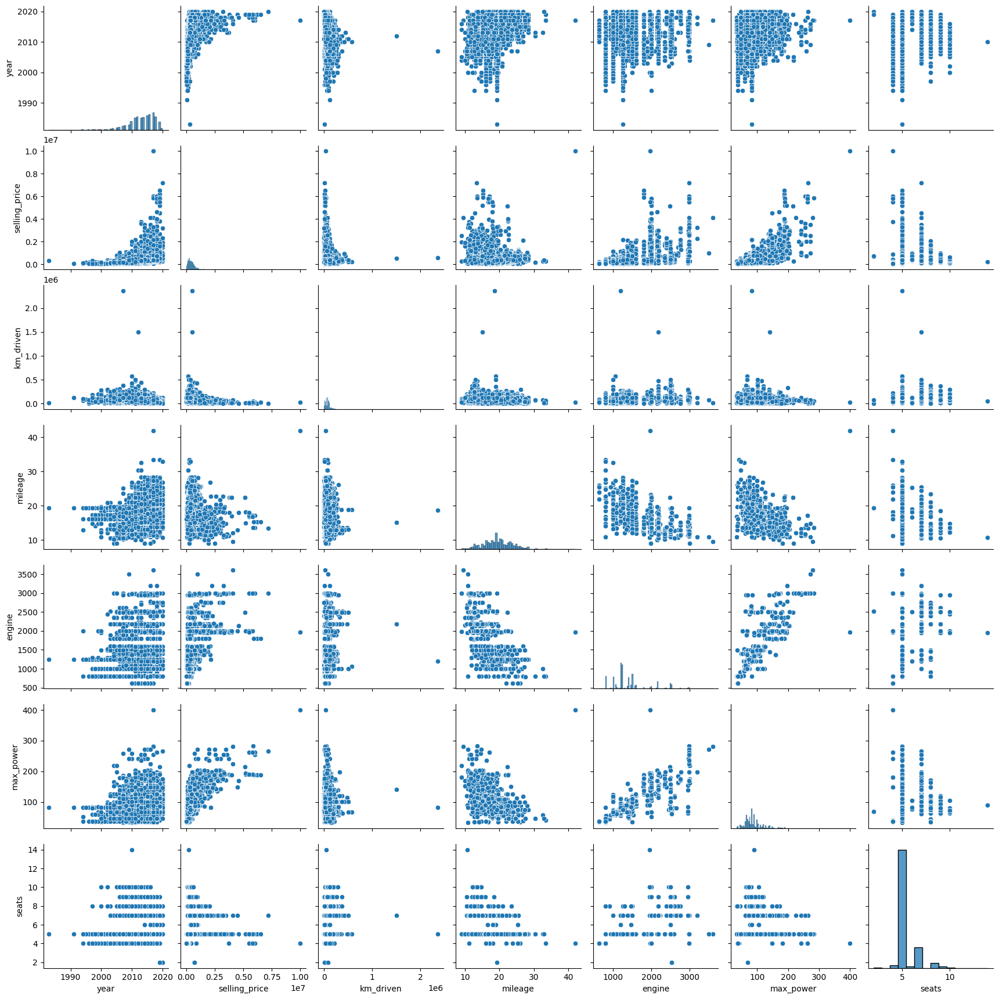

In [26]:
# график для трейна
sns.pairplot(df_train[['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']])

#### Связь признаков с целевой переменной:

Видим следующие корреляции: 
- Сильная положительная корреляция между ценой (selling_price) и годом машины (year);
- Сильная отрицательная корреляция между ценой и пробегом (km_driven);
- Умеренная отрицательная корреляция между ценой и mileage (расход топлива);
- Умеренная корреляция между ценой и мотором (engine) (чем больший показатель мотора, тем выше стоимость);
- Сильная корреляция между ценой и максимальной мощностью двигателя (max_power) (чем мощнее, тем дороже);
- Слабая отрицательная корреляция между ценой и количеством сидений в машине (seats). 

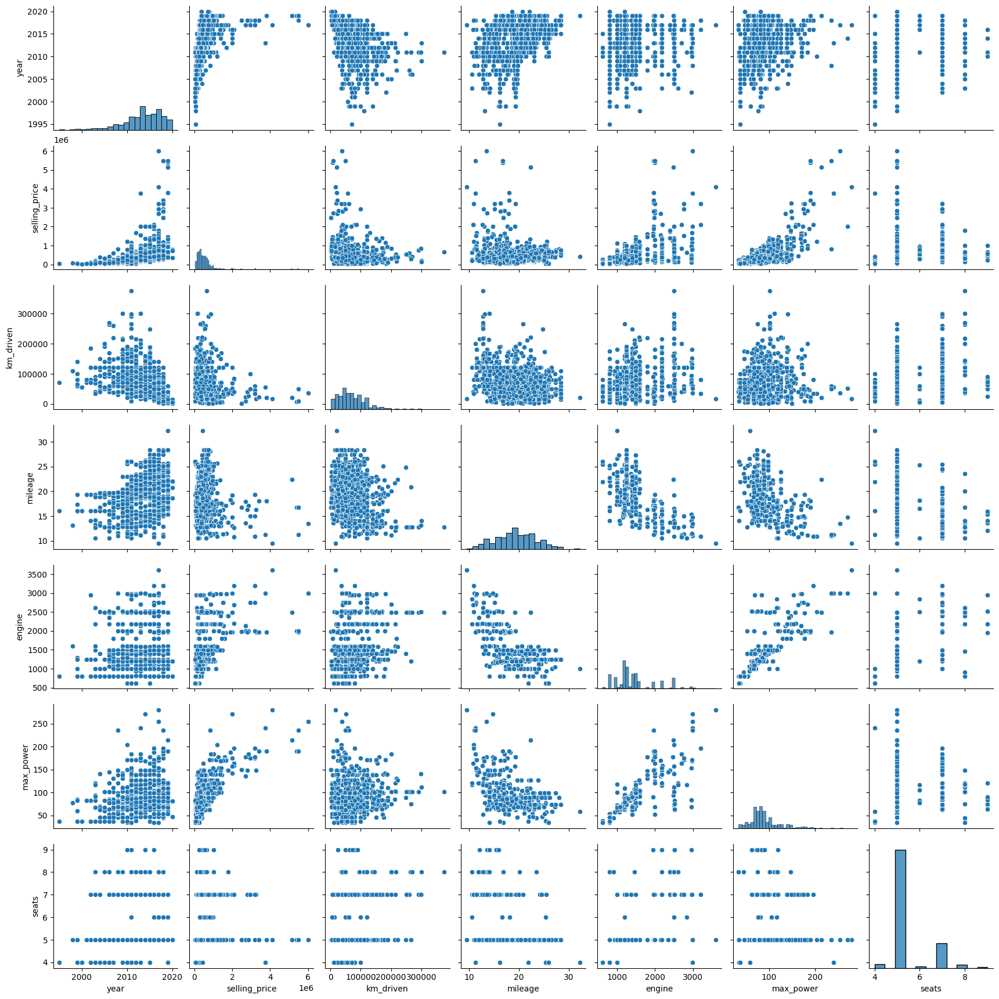

In [27]:
# график для теста
sns.pairplot(df_test[['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']])

#### Похожими ли оказались совокупности при разделении на трейн и тест?

Да, на графиках видно, что распределения примерно одинаковые. Разумеется, на трейн-датасете мы видим более четкий рисунок и более явно просматривающиеся паттерны, ввиду большего объема отображаемых данных. Однако при сравнении можно сделать вывод о схожести распределений по всем парам параметров (в большей или меньшей степени). 

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [28]:
#у нас тут только числовые признаки, потому что Пирсона только для них можно посчитать 
# посчитаем корреляции Пирсона для трейна:
numeric = ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']
corr = df_train[numeric].corr()
corr 

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.000000,0.427279,-0.368966,0.350087,0.002819,0.156927,0.041178
selling_price,0.427279,1.000000,-0.164828,-0.102968,0.447672,0.693683,0.149953
km_driven,-0.368966,-0.164828,1.000000,-0.190773,0.229766,0.024581,0.192328
mileage,0.350087,-0.102968,-0.190773,1.000000,-0.585836,-0.384499,-0.474668
engine,0.002819,0.447672,0.229766,-0.585836,1.000000,0.681933,0.652172
max_power,0.156927,0.693683,0.024581,-0.384499,0.681933,1.000000,0.243965
seats,0.041178,0.149953,0.192328,-0.474668,0.652172,0.243965,1.000000


<Axes: >

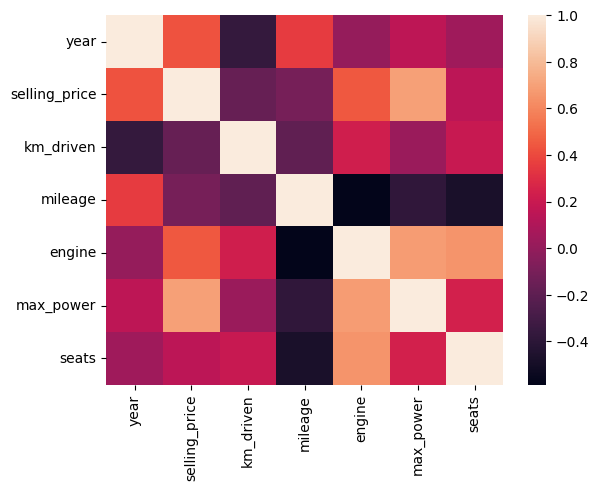

In [29]:
sns.heatmap(corr)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

1. Наименьшую корреляцию видим между столбцами year и engine (0.002819).
2. Наибольшая положительная линейная зависимость наблюдается между selling_price и max_power (0.693187)
3. В некотором смысле такое предположение сделать можно. Видим некоторую отрицательную корреляцию между двумя столбцами year и km_driven (-0.368966). Однако стоит отметить, что в общем случае такая корреляция не является сильной (умеренной будет). Но на фоне других связей это достаточно сильная связь. 

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

- Каждая дополнительная визуализация может принести до 0.25 баллов при условии, что она обоснована.

Text(0.5, 1.0, 'смотрим на связь цены, года и коробки передач')

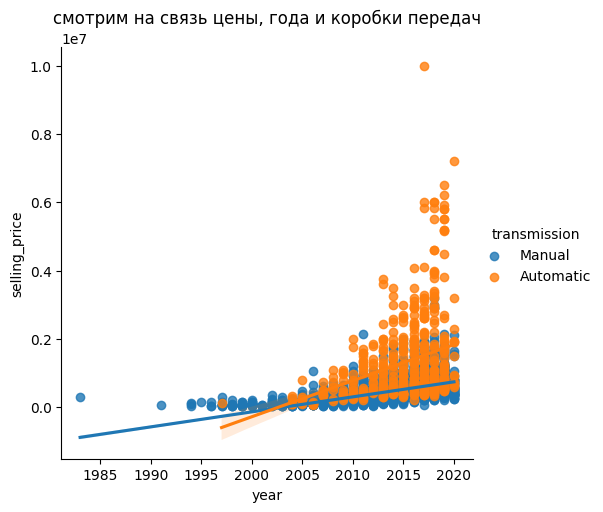

In [30]:
# можно попробовать порассматривать зависимости корреляции двух числовых призаков с каким-нибудь категориальным. 
#например, мы уже увидели, что цена хорошо коррелирует с годом - и это логично. Можно посмотреть как на эту зависимость будет влиять коробка передач (к примеру, автомат обычно стоит дороже механики):
sns.lmplot(data=df_train, x='year', y='selling_price', hue='transmission')
plt.title('смотрим на связь цены, года и коробки передач')

#### Вывод: 
Видим, что цены на машины с автоматической коробкой передач действительно растут намного быстрее. 

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [31]:
#создадим копию трейн датасета с вещественными признаками 
numeric = ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']
df_numtrain = df_train[numeric].copy()

#ну и сразу для теста то же самое сделаем
#создадим копию тест датасета с вещественными признаками 
numeric = ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']
df_numtest = df_test[numeric].copy()


In [32]:
y_train = df_numtrain['selling_price']
X_train = df_numtrain.drop(columns=['selling_price'])

In [33]:
assert X_train.shape == (5840, 6)

In [34]:
y_test = df_numtest['selling_price']
X_test = df_numtest.drop(columns=['selling_price'])

In [35]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [36]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
linear_pred = linear_model.predict(X_test)

print(f'''Metrics:
MSE={MSE(y_test, linear_pred)}
R2={r2_score(y_test, linear_pred)}
''')

Metrics:
MSE=233118004334.53738
R2=0.594456465240109



### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [37]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_trainscaled = scaler.fit_transform(X_train)
X_testscaled = scaler.transform(X_test) 

linear_scaled = LinearRegression()
linear_scaled.fit(X_trainscaled, y_train)
linear_scaled_pred = linear_scaled.predict(X_testscaled)

print(f'''Metrics:
MSE={MSE(y_test, linear_scaled_pred)}
R2={r2_score(y_test, linear_scaled_pred)}
''')

Metrics:
MSE=233118004334.53214
R2=0.5944564652401182



__Вывод:__ Можем заметить, что стандартизация не помогла добиться ощутимых улучшений в метриках. Изменения в метриках есть где-то вдали после запятой (однако в лучшую сторону)

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [38]:
#сначала напомним как выглядел вещественный трейн датасет до стандартизации
X_train.head()

,year,km_driven,mileage,engine,max_power,seats
0,2014,145500,23.400000,1248,74.000000,5
1,2014,120000,21.139999,1498,103.519997,5
2,2010,127000,23.000000,1396,90.000000,5
3,2007,120000,16.100000,1298,88.199997,5
4,2017,45000,20.139999,1197,81.860001,5


In [39]:
# X_trainscaled после стандартизации стал массивом. 
#Я не знаю, нужно ли его переделывать обратно в вид датасета, поэтому поработаю с ним в виде массива
print(X_trainscaled)

#считаем веса
weights = linear_scaled.coef_
print("\nвеса:", weights)

[[ 0.13956959  1.19115249  1.0141827  -0.37364298 -0.4419042  -0.43441899]
 [ 0.13956959  0.76661943  0.43023815  0.14116151  0.49303211 -0.43441899]
 [-0.83716668  0.88315792  0.91082979 -0.06887872  0.06483641 -0.43441899]
 ...
 [-0.10461448  0.60013588 -0.25189155 -0.4786631  -0.16161335 -0.43441899]
 [-1.56971888  0.74997108 -0.69114203  0.13086542  0.69826217 -0.43441899]
 [-1.08135075  0.76661943 -0.04518573 -0.37364298 -0.44507128 -0.43441899]]

веса: [149159.92572898 -44606.77144712  35958.32136958  60851.34209697
 326156.2775258  -19467.97375552]


#### Какой признак оказался наиболее информативным в предсказании цены?

Самым информативным (с весом 325202.1146989) оказался признак max_power. Этот факт ожидаем, поскольку в части 1 мы выяснили, что именно этот признак имеет наивысшую корреляцию с selling_price (в сравнении с прочими) - 0.693187. 

На втором месте по значимости и отрыву от остальных стоит параметр year, тут тоже нет ничего удивительного, если вспомнить вычисление корреляций в первой части. 

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [40]:
from sklearn.linear_model import Lasso

lasso = Lasso()
lasso.fit(X_trainscaled, y_train)
lasso_pred = lasso.predict(X_testscaled)

print(f'''Metrics:
MSE={MSE(y_test, lasso_pred)}
R2={r2_score(y_test, lasso_pred)}
''')

#а признаки вообще занулились? 
lasso_weights = lasso.coef_
print("признаки:",lasso_weights)

Metrics:
MSE=233118662283.55695
R2=0.5944553206396659

признаки: [149159.7849203  -44605.64062218  35956.41463685  60846.53207336
 326157.12966643 -19465.16143894]


#### Про качество Lasso:
Каких-то сильных изменений тоже мы тут не видим. В сравнении с линейной регрессией, MSE тут даже увеличилась. Даже если гиперпараметры как-то настраивать и менять, любые эксперименты показывают, что изменения незначительные совсем (разве что в худшую сторону меняются), что не говорит о каких-то существенных изменениях в качестве модели. 

#### Почему L-1 не занулила ничего по умолчанию: 

Дело в том: что при alpha=1 (по умолчанию) lasso, возможно, слишком мягкий. И все связь признаков между собой посчитал достаточно важными. Но даже если увеличивать этот параметр до alpha=1000, столбцы все равно не зануляются. Это позволяет сделать вывод о том, что все параметры действительно важны для предсказания. 

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [41]:
from sklearn.model_selection import GridSearchCV

param_grid = {'alpha': [1, 10, 50, 100, 500], 'max_iter': [5000, 7000], 'selection': ['cyclic', 'random'] }

grid = GridSearchCV(lasso, param_grid, cv=10)
grid.fit(X_trainscaled, y_train)
grid_pred = grid.predict(X_testscaled)

best = grid.best_params_
best_weights = grid.best_estimator_.coef_


print(f'''Metrics:
MSE={MSE(y_test, grid_pred)}
R2={r2_score(y_test, grid_pred)}
Лучший параметр: {best}
Веса: {best_weights}
''')

Metrics:
MSE=233449466170.52945
R2=0.5938798379436034
Лучший параметр: {'alpha': 500, 'max_iter': 5000, 'selection': 'cyclic'}
Веса: [149048.33559897 -44058.11583694  35061.75356956  58491.13813442
 326580.97986666 -18058.82493887]



In [42]:
# your code here

#### Сколько грид-сёрчу пришлось обучать моделей?
alpha - 5, max_iter - 2, selection - 2, cv - 10. 

Итого 5* 2 * 2 * 10 = 200 моделей. 

#### Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?
Коэффициент регуляризации у лучшей из моделей alpha=50. При этом никакие из весов не занулились. Результаты метрик снова ухудшились в сравнении с предыдущими моделями. 

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [43]:
from sklearn.linear_model import ElasticNet

elastic = ElasticNet(max_iter=5000)
grid_elastic = GridSearchCV(elastic, {'alpha': [0.001, 0.1, 1, 10, 50, 100, 500], 'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1]}, cv=10)
grid_elastic.fit(X_trainscaled, y_train)
grid_elastic_pred = grid_elastic.predict(X_testscaled)

In [44]:
print(f'''Metrics:
MSE={MSE(y_test, grid_elastic_pred)}
R2={r2_score(y_test, grid_elastic_pred)}
Лучшие параметры: {grid_elastic.best_params_}
''')

Metrics:
MSE=245653925968.6606
R2=0.5726483600039314
Лучшие параметры: {'alpha': 1, 'l1_ratio': 0.9}



#### Сколько пришлось обучать моделей? 
7 * 6 * 10 = 420 моделей. 
#### Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?
Видим, что показатели ухудшились по сравнению с теми, что посчитались для GridSearch.
Я не понимаю почему. Лучшие значения оказались при параметрах alpha=1, l1_ratio=0.9. 

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [45]:
df_train = df_train.drop(columns=['name'])
df_test = df_test.drop(columns=['name'])

print(df_train)

      year  selling_price  km_driven    fuel seller_type transmission  \
0     2014         450000     145500  Diesel  Individual       Manual   
1     2014         370000     120000  Diesel  Individual       Manual   
2     2010         225000     127000  Diesel  Individual       Manual   
3     2007         130000     120000  Petrol  Individual       Manual   
4     2017         440000      45000  Petrol  Individual       Manual   
...    ...            ...        ...     ...         ...          ...   
5835  2008         120000     191000  Petrol  Individual       Manual   
5836  2013         260000      50000  Petrol  Individual       Manual   
5837  2013         320000     110000  Petrol  Individual       Manual   
5838  2007         135000     119000  Diesel  Individual       Manual   
5839  2009         382000     120000  Diesel  Individual       Manual   

                     owner    mileage  engine   max_power  seats  
0              First Owner  23.400000    1248   74.00000

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert

In [46]:
#assert X_train_cat.shape == (5840, 10)

In [47]:
#X_train_cat.describe(include='object')

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [48]:
print("Уникальные значения одного из столбцов, чтобы убедиться, что get_dummies реально убирает один из столбцов (на примере fuel):")
print(df_train['fuel'].unique())

Уникальные значения одного из столбцов, чтобы убедиться, что get_dummies реально убирает один из столбцов (на примере fuel):
['Diesel' 'Petrol' 'LPG' 'CNG']


In [49]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

categorial = ['fuel', 'seller_type', 'transmission', 'owner', 'seats']
df_train_encoded = pd.get_dummies(df_train, columns=categorial, drop_first=True)

#для теста тоже 
df_test_encoded = pd.get_dummies(df_test, columns=categorial, drop_first=True)

df_train_encoded

,year,selling_price,km_driven,mileage,engine,max_power,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,2014,450000,145500,23.400000,1248,74.000000,True,False,False,True,...,False,False,False,True,False,False,False,False,False,False
1,2014,370000,120000,21.139999,1498,103.519997,True,False,False,True,...,False,False,False,True,False,False,False,False,False,False
2,2010,225000,127000,23.000000,1396,90.000000,True,False,False,True,...,False,False,False,True,False,False,False,False,False,False
3,2007,130000,120000,16.100000,1298,88.199997,False,False,True,True,...,False,False,False,True,False,False,False,False,False,False
4,2017,440000,45000,20.139999,1197,81.860001,False,False,True,True,...,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,120000,191000,17.920000,1086,62.099998,False,False,True,True,...,False,False,False,True,False,False,False,False,False,False
5836,2013,260000,50000,18.900000,998,67.099998,False,False,True,True,...,False,False,False,True,False,False,False,False,False,False
5837,2013,320000,110000,18.500000,1197,82.849998,False,False,True,True,...,False,False,False,True,False,False,False,False,False,False
5838,2007,135000,119000,16.799999,1493,110.000000,True,False,False,True,...,False,False,False,True,False,False,False,False,False,False


In [50]:
#а тут мы убедимся, что для fuel в действительности 3 столбца, а не 4
df_train_encoded.columns

Index(['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power',
       'fuel_Diesel', 'fuel_LPG', 'fuel_Petrol', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Manual',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Test Drive Car', 'owner_Third Owner', 'seats_4', 'seats_5',
       'seats_6', 'seats_7', 'seats_8', 'seats_9', 'seats_10', 'seats_14'],
      dtype='object')

__Вывод:__ Закодировали категориальные столбцы с помощью функции get_dummies. 
Ячейки, оставленные выше, помогают убедиться, что мы закодировали столбцы корректно: для каждой из категорий убрали по одному столбцу, чтобы не было мультиколлинеарности. 

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [51]:
#поскольку это уже не тот вещественный датасет, с которым работали, то заново разбеляем на X и y, а также стандартизируем

#делим на Х и у
X_train_encoded = df_train_encoded.drop('selling_price', axis=1)
y_train_encoded = df_train_encoded['selling_price']
X_test_encoded = df_test_encoded.drop('selling_price', axis=1)
y_test_encoded = df_test_encoded['selling_price']

#решим проблему того, что get_dummies для параметра seats сделал разных набор колонок для трейна и теста (просто в тесте не было некоторых примеров с конкретным количеством мест) 
#добавим эти колонки
X_test_encoded['seats_4'] = 0
X_test_encoded['seats_10'] = 0
X_test_encoded['seats_14'] = 0 
X_test_encoded = X_test_encoded[X_train_encoded.columns]

#стандартизируем 
scaler_all = StandardScaler()
X_train_scaled_all = scaler_all.fit_transform(X_train_encoded)
X_test_scaled_all = scaler_all.transform(X_test_encoded)

In [52]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()
grid_ridge = GridSearchCV(ridge,  {'alpha': [0.001, 0.1, 1, 10, 50, 100, 500, 1000]}, cv=10, scoring='r2', n_jobs=-1)
grid_ridge.fit(X_train_encoded, y_train_encoded)
grid_ridge_pred = grid_ridge.predict(X_test_encoded)

In [53]:
print(f'''Metrics:
MSE={MSE(y_test, grid_ridge_pred)}
R2={r2_score(y_test, grid_ridge_pred)}
''')

Metrics:
MSE=205945415587.8757
R2=0.6417272357683441



 #### Удалось ли улучшить качество прогнозов?

 Да!! Удалось улучшить показатель R2 и уменьшить ошибку MSE. Показатели по-прежнему остаются так себе, однако это ощутимый прогресс, в сравнении с прошлыми опытами. 

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [54]:
models = {
    'Linear': linear_pred,
    'Linear Scaled': linear_scaled_pred, 
    'Lasso': lasso_pred,
    'Grid Search CV': grid_pred,
    'ElasticNet': grid_elastic_pred,
    'Ridge': grid_ridge_pred
}

def business_metric(y_true, y_pred):
    metrics={}
    for name, pred in y_pred.items():
        error = np.abs((y_true - pred)/y_true) * 100
        good = np.mean(error <= 10.0)
        metrics[name] = good
    return metrics
        

results = business_metric(y_test, models)

for i in models:
    print([i], results[i], '\n')

['Linear'] 0.224 

['Linear Scaled'] 0.224 

['Lasso'] 0.224 

['Grid Search CV'] 0.227 

['ElasticNet'] 0.247 

['Ridge'] 0.244 



По итогам вычислений написанной метрики, видим, что лучше всего с задачей справляется Elastic модель, не смотря на то, что показатель R2 у этой модели значительно ниже, чем у Ridge. Однако даже для нее результаты показывают очень низкую точность. Возможно, это указывает, что Ridge, даже имея лучшие метрики (по сравнению с ElasticNet), является менее стабильной. 

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

#### Комментарий к решению: 
Для приложения я выбрала Ridge, которая по итогам выполнения задания имеет самое высокое качество по метрикам MSE и R2. Другая модель - ElasticNet - хоть и имеет более высокий результат отработки функции business_metric, но было решено исходить из качества по метрикам, обозначенным в самом начале задания - это R2, MSE. 

In [55]:
import pickle
import os

In [56]:
#тут я копировала из ноутбука практически полностью

model_dir = 'models'
os.makedirs(model_dir, exist_ok=True)

#сохраняю модель
model_ridge = {"model": grid_ridge, "scaler": scaler_all, "feature_names": list(X_train_encoded.columns)}
model_path = os.path.join(model_dir, "model_ridge.pkl")
with open(model_path, 'wb') as f:
    pickle.dump(model_ridge, f, protocol=pickle.HIGHEST_PROTOCOL)

print(f"Модель Ridge сохранена: {model_path}")
print(f"   Размер файла: {os.path.getsize(model_path) / 1024:.2f} KB")

# Загрузка модели
with open(model_path, 'rb') as f:
    loaded_model = pickle.load(f)


Модель Ridge сохранена: models/model_ridge.pkl
   Размер файла: 4.70 KB


# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

**И ссылку на приложение в StreamlitHub.**

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.



### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 18 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Далее в этот же репозиторий вы прикрепите вторую часть. Под результатами первой части понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)
